# Método L-BFGS-B

### 1. Importación de Librerías y Configuración
En este bloque se inicializa el entorno de trabajo cargando las librerías necesarias:

* *Matemáticas y Datos:* numpy (cálculo matricial), pandas (manejo de datos en tablas) y scipy.optimize (algoritmos de optimización para encontrar mínimos/máximos).
* *Física Solar:* pysolar (permite obtener la posición exacta del sol: elevación y azimut).
* *Tiempo:* datetime y pytz (manejo preciso de fechas, horas y zonas horarias locales).
* *Visualización:* matplotlib (gráficos estáticos, 3D y animaciones) y plotly (gráficos interactivos).
* *Configuración:* %matplotlib inline asegura que los gráficos se muestren directamente debajo de la celda de código.

In [ ]:
# Instalamos las librerías si no las tienes (quita el # si te da error de "no module found")
# !pip install pysolar scipy numpy matplotlib pytz

import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import minimize
from pysolar.solar import get_altitude, get_azimuth
from datetime import datetime
from pytz import timezone

# Configuramos para que los gráficos se vean bonitos
%matplotlib inline

### 2. Configuración Física y Modelo Matemático
En este bloque definimos las restricciones del hardware y las funciones de transformación de coordenadas:

1.  *Límites del Hardware:* Se establecen los ángulos máximos y mínimos (ROLL_MAX, PITCH_MAX) para proteger los servos/motores.
2.  *Vector Solar (get_vector_solar):* Convierte la posición del sol dada por pysolar (Altitud y Azimut en grados) a un *Vector Unitario Cartesiano $(x, y, z)$*.
    * Convención usada: Eje Y = Norte, Eje X = Este, Eje Z = Zénit (Arriba).
3.  *Matrices de Rotación:* Se definen las matrices de rotación estándar para los ejes X (Roll) y Y (Pitch).
4.  *Cinemática Directa (simular_panel):* Calcula hacia dónde apunta el panel solar dadas unas coordenadas de motor $(roll, pitch)$.
    * Orden de operación: El código aplica Ry @ (Rx @ vector), lo que implica una jerarquía mecánica específica donde el movimiento en Pitch afecta al marco de referencia del Roll.

In [3]:
import numpy as np
from pysolar.solar import get_altitude, get_azimuth

# --- CONFIGURACIÓN FÍSICA DEL TRACKER ---
# Límites reales de tus motores (en grados)
LIMITE_ROLL_MIN, LIMITE_ROLL_MAX = -60, 60   # Eje Este-Oeste
LIMITE_PITCH_MIN, LIMITE_PITCH_MAX = -45, 45 # Eje Norte-Sur

# Posición de descanso para la noche (Stow)
POSICION_REPOSO = (0, 0)

def get_vector_solar(lat, lon, fecha):
    """
    Calcula el vector unitario del sol (x, y, z) usando Pysolar.
    Convención Pysolar: Norte=0, Este=90, Sur=180, Oeste=270.
    """
    try:
        alt_deg = get_altitude(lat, lon, fecha)
        az_deg = get_azimuth(lat, lon, fecha)
        
        # Convertir a radianes
        alt_rad = np.radians(alt_deg)
        az_rad = np.radians(az_deg)
        
        # Conversión Esférica a Cartesiana (N=0, E=90)
        # X (Este)  = cos(alt) * sin(az)
        # Y (Norte) = cos(alt) * cos(az)
        # Z (Arriba)= sin(alt)
        x = np.cos(alt_rad) * np.sin(az_rad)
        y = np.cos(alt_rad) * np.cos(az_rad)
        z = np.sin(alt_rad)
        
        return np.array([x, y, z]), alt_deg, az_deg
        
    except Exception as e:
        print(f"Error calculando vector solar: {e}")
        return np.array([0,0,1]), 0, 0

def rotacion_x(theta_deg):
    """Rotación Roll (alrededor del eje X/Este)"""
    rad = np.radians(theta_deg)
    c, s = np.cos(rad), np.sin(rad)
    return np.array([[1, 0, 0], [0, c, -s], [0, s, c]])

def rotacion_y(theta_deg):
    """Rotación Pitch (alrededor del eje Y/Norte)"""
    rad = np.radians(theta_deg)
    c, s = np.cos(rad), np.sin(rad)
    return np.array([[c, 0, s], [0, 1, 0], [-s, 0, c]])

def simular_panel(roll, pitch):
    """
    Calcula hacia dónde apunta el panel.
    Orden de rotación: Primero aplicamos Roll (X), luego Pitch (Y).
    Esto simula que el motor de Pitch mueve toda la estructura del de Roll.
    """
    normal_inicial = np.array([0, 0, 1]) # Apuntando al Zénit
    
    # Matrices de rotación
    Rx = rotacion_x(roll)
    Ry = rotacion_y(pitch)
    
    # Aplicamos rotaciones: V_final = Ry @ (Rx @ V_inicial)
    vector_panel = Ry @ (Rx @ normal_inicial)
    
    return vector_panel

### 3. Algoritmo de Optimización y Control
En este bloque implementamos la lógica de control basada en optimización numérica:

1.  *Función Objetivo (funcion_objetivo):* Define qué significa "estar bien alineado".
    * Calcula el *Producto Punto* entre el vector normal del panel y el vector del sol.
    * El producto punto de dos vectores unitarios es igual al coseno del ángulo entre ellos ($\cos \theta$).
    * Si $\theta = 0^\circ$ (alineación perfecta), $\cos(0) = 1$.
    * Como la función minimize busca el valor más bajo, retornamos el *negativo* ($-1$ es mejor que $-0.5$).

2.  *Buscador de Ángulos (encontrar_angulos_optimos):*
    * Utiliza el algoritmo *L-BFGS-B* (Limited-memory Broyden–Fletcher–Goldfarb–Shanno con Bordes).
    * Este algoritmo busca iterativamente la combinación de roll y pitch que minimiza la función objetivo, respetando los límites físicos (bounds) definidos anteriormente.
    * Si es de noche (altitud solar < 0), retorna automáticamente la posición de reposo.

In [4]:
from scipy.optimize import minimize

def funcion_objetivo(angulos, vector_sol):
    """
    Calcula qué tan alineado está el panel con el sol.
    Retorna un valor negativo porque 'minimize' busca el valor más bajo.
    """
    roll, pitch = angulos
    
    # Obtenemos hacia dónde mira el panel con estos ángulos
    vector_panel = simular_panel(roll, pitch)
    
    # Producto punto: 1.0 significa perfectamente alineados.
    # Minimizamos el negativo (-1.0) para encontrar el máximo.
    cos_incidencia = np.dot(vector_panel, vector_sol)
    return -cos_incidencia

def encontrar_angulos_optimos(fecha, lat, lon):
    """
    Encuentra el mejor Roll y Pitch para una fecha dada, respetando límites.
    """
    # 1. Obtener vector del sol real
    v_sol, alt_sol, az_sol = get_vector_solar(lat, lon, fecha)
    
    # 2. Si el sol está bajo el horizonte (noche), ir a reposo
    if alt_sol < 0:
        return POSICION_REPOSO[0], POSICION_REPOSO[1], az_sol, alt_sol
    
    # 3. Optimización
    x0 = [0, 0] # Empezar buscando desde el centro
    
    # Límites físicos de los motores
    limites = [(LIMITE_ROLL_MIN, LIMITE_ROLL_MAX), (LIMITE_PITCH_MIN, LIMITE_PITCH_MAX)]
    
    try:
        resultado = minimize(
            funcion_objetivo, 
            x0, 
            args=(v_sol,), 
            method='L-BFGS-B', 
            bounds=limites
        )
        
        if resultado.success:
            # Retornamos 4 valores para mantener compatibilidad con tu código anterior
            return resultado.x[0], resultado.x[1], az_sol, alt_sol
        else:
            return x0[0], x0[1], az_sol, alt_sol
            
    except Exception as e:
        print(f"Fallo en optimizador: {e}")
        return 0, 0, az_sol, alt_sol

### 4. Simulación Temporal y Lógica Día/Noche
En este bloque ejecutamos la simulación completa a lo largo del tiempo definido por el usuario:

1.  **Gestión del Tiempo:**
    * Solicita hora de inicio y fin.
    * Maneja inteligentemente el cambio de día (si pides de 18:00 a 06:00, entiende que la 06:00 es *mañana*).
    * Usa `timezone("America/Guayaquil")` para asegurar precisión local.

2.  **Lógica Híbrida de Control:**
    * **Modo Diurno (06:00 - 18:00):** Llama a `encontrar_angulos_optimos` para rastrear el sol activamente.
    * **Modo Nocturno (18:00 - 06:00):** Implementa un movimiento de "retorno lento". En lugar de gastar energía volviendo de golpe al Este, el tracker se mueve muy despacio desde la posición final del atardecer hasta la posición inicial del amanecer del día siguiente. Esto reduce el estrés mecánico y el consumo pico de corriente.

3.  **Almacenamiento:**
    * Guarda cada paso de tiempo (cada 10 minutos) en una lista de diccionarios.
    * Convierte los resultados final en un `DataFrame` de Pandas para facilitar el análisis y graficación posterior.

In [13]:
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
from pytz import timezone

def simular_rango_usuario(lat, lon):
    # --- 1. Pedir horas al usuario ---
    try:
        print("--- Configuración de la Simulación ---")
        h_ini_str = input("Ingrese Hora de Inicio (0-23): ")
        h_fin_str = input("Ingrese Hora de Fin (0-23): ")
        
        h_ini = int(h_ini_str)
        h_fin = int(h_fin_str)
    except ValueError:
        print("Error: Por favor ingresa números enteros.")
        return pd.DataFrame()

    # --- 2. Configurar las fechas (Lógica Robusta) ---
    ahora = datetime.now(timezone("America/Guayaquil"))
    
    # Fecha Inicio: Hoy a la hora indicada
    fecha_inicio = ahora.replace(hour=h_ini, minute=0, second=0, microsecond=0)
    
    # Fecha Fin:
    # Si fin <= inicio (ej: 6am a 6am, o 18pm a 6am), asumimos día siguiente.
    if h_fin <= h_ini:
        fecha_fin = fecha_inicio + timedelta(days=1)
        fecha_fin = fecha_fin.replace(hour=h_fin, minute=0, second=0, microsecond=0)
    else:
        # Si fin > inicio (ej: 6am a 18pm), es el mismo día
        fecha_fin = fecha_inicio.replace(hour=h_fin, minute=0, second=0, microsecond=0)
    
    print(f"\n--- Verificación de Fechas ---")
    print(f"Inicio: {fecha_inicio.strftime('%d/%m %H:%M')}")
    print(f"Fin:    {fecha_fin.strftime('%d/%m %H:%M')}")
    print(f"Duración: {(fecha_fin - fecha_inicio).total_seconds()/3600:.1f} horas")

    # --- 3. Pre-calcular puntos clave ---
    ref_atardecer = fecha_inicio.replace(hour=18, minute=0, second=0)
    if fecha_inicio.hour > 18:
         ref_atardecer = fecha_inicio.replace(hour=18, minute=0, second=0)
    
    # Referencia para el amanecer del día siguiente (para interpolar)
    # Buscamos las 6am del día siguiente al inicio
    ref_amanecer_sig = fecha_inicio.replace(hour=6, minute=0, second=0) + timedelta(days=1)

    roll_sunset, pitch_sunset, _, _ = encontrar_angulos_optimos(ref_atardecer, lat, lon)
    roll_sunrise, pitch_sunrise, _, _ = encontrar_angulos_optimos(ref_amanecer_sig, lat, lon)
    
    resultados = []
    
    # --- 4. Bucle de Simulación (WHILE para asegurar que llegue al final) ---
    tiempo_iteracion = fecha_inicio
    
    # Mientras no nos pasemos de la fecha fin...
    while tiempo_iteracion <= fecha_fin:
        
        hora_actual = tiempo_iteracion.hour
        minuto_actual = tiempo_iteracion.minute
        
        # Datos del sol real
        az_sol = get_azimuth(lat, lon, tiempo_iteracion)
        alt_sol = get_altitude(lat, lon, tiempo_iteracion)
        
        # --- LÓGICA DE CONTROL ---
        if 6 <= hora_actual < 18:
            # === ES DE DÍA ===
            roll, pitch, _, _ = encontrar_angulos_optimos(tiempo_iteracion, lat, lon)
        else:
            # === ES DE NOCHE ===
            # Calculamos progreso de la noche (18:00 -> 06:00 son 720 mins)
            total_minutos_noche = 12 * 60
            
            # Calculamos minutos desde las 18:00 de ayer/hoy
            if hora_actual >= 18:
                mins_pasados = (hora_actual - 18) * 60 + minuto_actual
            else:
                # Si es madrugada (ej 02:00), sumamos lo que pasó antes de medianoche
                mins_pasados = (24 - 18) * 60 + (hora_actual * 60) + minuto_actual
            
            progreso = min(mins_pasados / total_minutos_noche, 1.0)
            
            # Interpolación
            roll = roll_sunset + (roll_sunrise - roll_sunset) * progreso
            pitch = pitch_sunset + (pitch_sunrise - pitch_sunset) * progreso
            
        resultados.append({
            "Hora": tiempo_iteracion.strftime("%H:%M"),
            "Sol_Azimuth": az_sol,
            "Sol_Elevacion": alt_sol,
            "Motor_Roll": roll,
            "Motor_Pitch": pitch
        })
        
        # Avanzamos 10 minutos
        tiempo_iteracion += timedelta(minutes=10)
        
    df = pd.DataFrame(resultados)
    
    # Verificación final
    if not df.empty:
        print(f"\nSe generaron {len(df)} registros.")
        print("Últimos 3 registros generados:")
        print(df.tail(3)[['Hora', 'Motor_Roll', 'Motor_Pitch']])
    
    return df

# --- EJECUTAR ---
df_datos = simular_rango_usuario(-0.2105367, -78.491614)

--- Configuración de la Simulación ---

--- Verificación de Fechas ---
Inicio: 31/01 06:00
Fin:    31/01 18:00
Duración: 12.0 horas

Se generaron 73 registros.
Últimos 3 registros generados:
     Hora  Motor_Roll  Motor_Pitch
70  17:40   20.174231        -45.0
71  17:50   20.735197        -45.0
72  18:00   21.361177        -45.0


### 5. Visualización de Resultados (Gráficos 2D)
En este bloque generamos dos gráficos comparativos para validar el comportamiento del tracker:

1.  **Gráfico Izquierdo (Pitch vs. Elevación):**
    * Compara qué tan alto está el sol (**Línea Amarilla Punteada**) vs. qué ángulo adoptó el motor de Pitch (**Línea Azul Sólida**).
    * *Objetivo:* Verificar que el motor "sigue" la curva de subida y bajada del sol, y detectar saturaciones (zonas planas) donde se alcanzan los límites mecánicos.

2.  **Gráfico Derecho (Roll vs. Azimuth):**
    * Compara el movimiento Este-Oeste del sol (**Línea Amarilla**) vs. el giro del motor Roll (**Línea Roja**).
    * *Nota:* Las escalas son diferentes (Azimuth va de 0 a 360°, Roll de -60° a +60°), pero buscamos ver si la **tendencia** es correcta (cuando el Azimuth crece hacia el Oeste, el Roll debe aumentar positivamente).

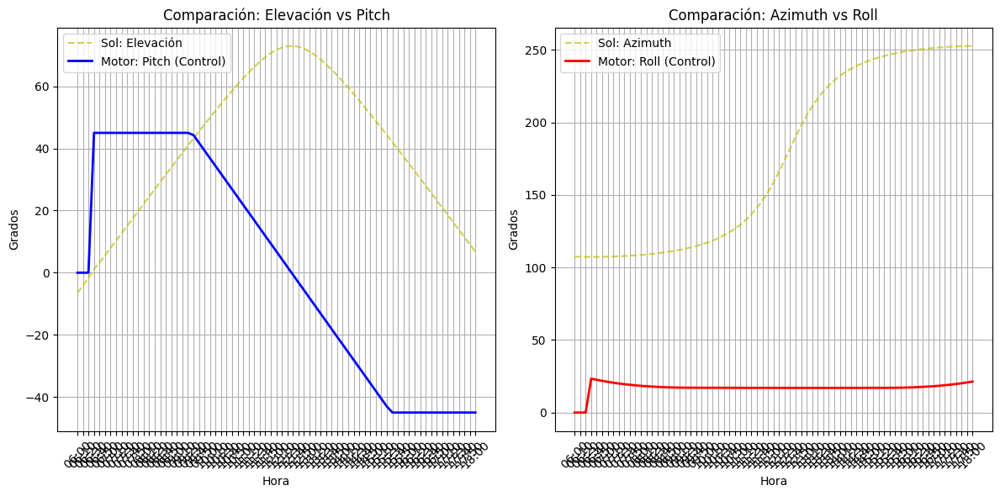

In [14]:
# Asegúrate de que df_datos tiene datos (ejecuta el paso anterior si no)
plt.figure(figsize=(12, 6))

# Graficamos Elevación del Sol vs. Pitch del Motor
plt.subplot(1, 2, 1)
plt.plot(df_datos['Hora'], df_datos['Sol_Elevacion'], 'y--', label='Sol: Elevación', alpha=0.7)
plt.plot(df_datos['Hora'], df_datos['Motor_Pitch'], 'b-', label='Motor: Pitch (Control)', linewidth=2)
plt.title('Comparación: Elevación vs Pitch')
plt.xlabel('Hora')
plt.ylabel('Grados')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)

# Graficamos Azimuth del Sol vs. Roll del Motor
plt.subplot(1, 2, 2)
# Nota: A veces se normaliza el Azimuth para que se vea mejor en la gráfica, 
# pero aquí lo mostramos crudo para ver la correlación.
plt.plot(df_datos['Hora'], df_datos['Sol_Azimuth'], 'y--', label='Sol: Azimuth', alpha=0.7)
plt.plot(df_datos['Hora'], df_datos['Motor_Roll'], 'r-', label='Motor: Roll (Control)', linewidth=2)
plt.title('Comparación: Azimuth vs Roll')
plt.xlabel('Hora')
plt.ylabel('Grados')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

### 6. Visualización 3D Estática (Snapshot)
En este bloque creamos una herramienta de diagnóstico visual:

1.  **Función `plot_vectores_3d(idx)`:**
    * Toma un índice específico (un momento en el tiempo) del DataFrame `df_datos`.
    * **Reconstrucción de Vectores:** Convierte los ángulos guardados (Azimuth/Elevación del Sol y Roll/Pitch del Motor) nuevamente a vectores cartesianos $(x, y, z)$.
    * **Graficado con `quiver`:** Utiliza la herramienta de "campos vectoriales" de Matplotlib para dibujar dos flechas desde el origen $(0,0,0)$:
        * **Flecha Naranja:** Vector del Sol (Objetivo).
        * **Flecha Azul:** Vector Normal del Panel (Resultado del control).
2.  **Validación Visual:** Si el algoritmo funciona, la flecha azul debería estar muy cerca (o encima) de la naranja, a menos que se hayan alcanzado los límites mecánicos (saturación).

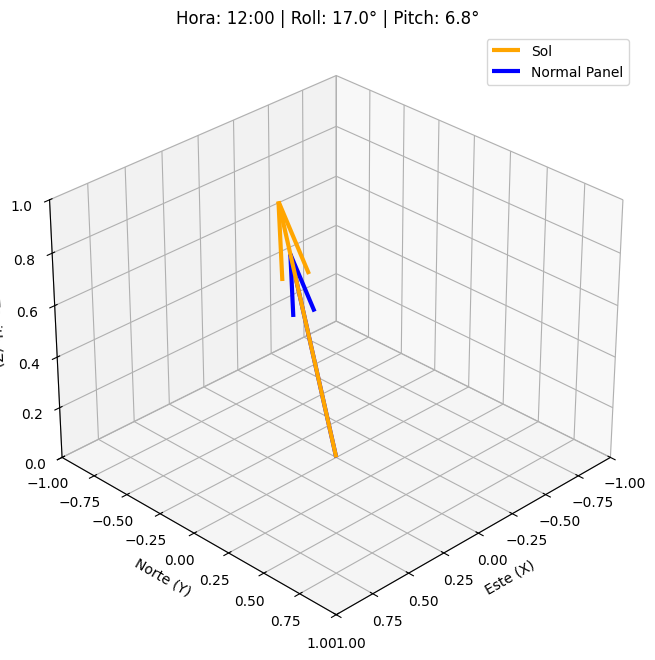

In [15]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

def plot_vectores_3d(idx):
    # Verificar si el índice es válido
    if idx >= len(df_datos):
        print(f"Índice {idx} fuera de rango.")
        return

    datos = df_datos.iloc[idx]
    
    # 1. Recuperar datos del DataFrame
    az = datos['Sol_Azimuth']
    el = datos['Sol_Elevacion']
    roll = datos['Motor_Roll']
    pitch = datos['Motor_Pitch']
    hora = datos['Hora']

    # 2. Calcular Vector Sol (Conversión manual consistente con nuestra lógica nueva)
    # Convención: Norte=0, Este=90 (Ejes: Y=Norte, X=Este)
    az_rad = np.radians(az)
    el_rad = np.radians(el)
    
    sx = np.cos(el_rad) * np.sin(az_rad) # X = Este
    sy = np.cos(el_rad) * np.cos(az_rad) # Y = Norte
    sz = np.sin(el_rad)                  # Z = Arriba
    vec_sol = np.array([sx, sy, sz])

    # 3. Calcular Vector Panel (Usando la NUEVA función simular_panel)
    vec_panel = simular_panel(roll, pitch)

    # --- GRAFICAR ---
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Dibujar flecha del SOL (Amarillo)
    ax.quiver(0, 0, 0, vec_sol[0], vec_sol[1], vec_sol[2], 
              length=1.0, color='orange', label='Sol', linewidth=3)

    # Dibujar flecha del PANEL (Azul)
    ax.quiver(0, 0, 0, vec_panel[0], vec_panel[1], vec_panel[2], 
              length=0.8, color='blue', label='Normal Panel', linewidth=3)

    # Configuración de ejes
    ax.set_xlim([-1, 1]); ax.set_ylim([-1, 1]); ax.set_zlim([0, 1])
    ax.set_xlabel('Este (X)'); ax.set_ylabel('Norte (Y)'); ax.set_zlabel('Zenith (Z)')
    ax.set_title(f"Hora: {hora} | Roll: {roll:.1f}° | Pitch: {pitch:.1f}°")
    ax.legend()
    
    # Vista superior para ver mejor la orientación
    ax.view_init(elev=30, azim=45)
    plt.show()

# --- PRUEBA ---
# Probamos un índice intermedio (ej. mitad del día simulado)
if not df_datos.empty:
    mitad = len(df_datos) // 2
    plot_vectores_3d(mitad)
else:
    print("No hay datos para graficar. Ejecuta primero la simulación.")

### 7. Generación de Animación
En este bloque final, convertimos la serie de datos en una película para visualizar la dinámica del movimiento:

1.  **Función `update_plot(i)`:** Esta es la función que se ejecuta para cada "cuadro" (frame) del video.
    * **Limpieza (`ax.clear`):** Borra el dibujo anterior para que las flechas no se acumulen.
    * **Redibujado:** Vuelve a calcular y dibujar los vectores Sol (Naranja) y Panel (Azul) para el índice `i`.
    * **Fijación de Ejes:** Mantiene los límites X, Y, Z fijos (`[-1, 1]`). Esto es crucial; si no se hiciera, la cámara haría zoom in/out erráticamente intentando ajustarse al tamaño de las flechas.

2.  **Motor de Animación (`FuncAnimation`):**
    * Recorre el DataFrame desde la fila 0 hasta la final.
    * Genera un intervalo de 50ms entre cuadros (movimiento fluido).

3.  **Salida:**
    * Guarda un archivo físico: `animacion_tracker_corregida.gif`.
    * Muestra un reproductor interactivo en el Notebook usando HTML5.

Generando animación de 73 cuadros...
¡Animación guardada como 'animacion_tracker_corregida.gif'!


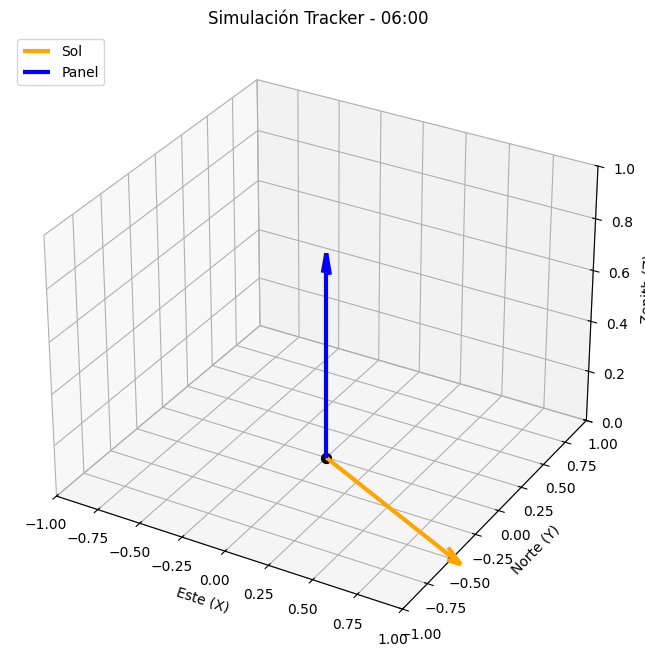

In [16]:
import matplotlib.animation as animation
from IPython.display import HTML, display
import matplotlib.pyplot as plt
import numpy as np

# Configuración de la figura
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

def update_plot(i):
    ax.clear() # Limpiamos el gráfico para el nuevo frame
    
    # Verificar si el índice es válido para evitar errores al final
    if i >= len(df_datos): 
        return

    # Datos del frame actual
    datos = df_datos.iloc[i]
    hora = datos['Hora']
    
    # 1. Calcular Vector Sol (NUEVO: Consistente con Pysolar N=0, E=90)
    az_rad = np.radians(datos['Sol_Azimuth'])
    el_rad = np.radians(datos['Sol_Elevacion'])
    
    sx = np.cos(el_rad) * np.sin(az_rad) # X = Este
    sy = np.cos(el_rad) * np.cos(az_rad) # Y = Norte
    sz = np.sin(el_rad)                  # Z = Arriba
    vec_sol = np.array([sx, sy, sz])

    # 2. Calcular Vector Panel (NUEVO: Usando la función actualizada)
    vec_panel = simular_panel(datos['Motor_Roll'], datos['Motor_Pitch'])
    
    # --- DIBUJO ---
    # Punto central (origen)
    ax.scatter(0, 0, 0, color='black', s=50)
    
    # Flecha del Sol (Naranja)
    ax.quiver(0, 0, 0, vec_sol[0], vec_sol[1], vec_sol[2], 
              color='orange', length=1.0, arrow_length_ratio=0.1, 
              label='Sol', linewidth=3)
    
    # Flecha del Panel (Azul)
    ax.quiver(0, 0, 0, vec_panel[0], vec_panel[1], vec_panel[2], 
              color='blue', length=0.8, arrow_length_ratio=0.1, 
              label='Panel', linewidth=3)
    
    # Configuración de ejes (fijos para que no "bailen")
    ax.set_xlim([-1, 1]); ax.set_ylim([-1, 1]); ax.set_zlim([0, 1])
    ax.set_xlabel('Este (X)'); ax.set_ylabel('Norte (Y)'); ax.set_zlabel('Zenith (Z)')
    ax.set_title(f"Simulación Tracker - {hora}")
    
    # Leyenda fija
    ax.legend(loc='upper left')

# Crear la animación
print(f"Generando animación de {len(df_datos)} cuadros...")
ani = animation.FuncAnimation(fig, update_plot, frames=len(df_datos), interval=50)

# Guardar como GIF
ani.save('animacion_tracker_corregida.gif', writer='pillow', fps=15)
print("¡Animación guardada como 'animacion_tracker_corregida.gif'!")

# Mostrar en Jupyter
try:
    display(HTML(ani.to_jshtml()))
except Exception as e:
    print(f"No se pudo mostrar el reproductor interactivo: {e}")

### 8. Gemelo Digital Interactivo (Plotly)
Este bloque genera una visualización 3D interactiva de alta fidelidad:

1.  **Matemática Visual:**
    * Reconstruye la geometría del panel (4 esquinas) en cada instante de tiempo.
    * Utiliza las matrices de rotación `Rx` y `Ry` para transformar un cuadrado plano en el origen $(Z=0)$ a su posición final inclinada.
    
2.  **Tecnología de Animación:**
    * Crea una lista de **Frames** (cuadros). Cada frame contiene la posición exacta del Sol (esfera naranja), el Rayo Solar (línea punteada) y el Panel (malla azul).
    * Define controles de interfaz (Botones Play/Pausa y Slider de tiempo) para navegar por la simulación.
    
3.  **Resultado:** Un gráfico HTML donde se puede inspeccionar visualmente si la normal del panel (flecha azul) persigue correctamente al sol a lo largo de todo el día.

In [17]:
import plotly.graph_objects as go
import numpy as np

def visualizar_gemelo_digital(df_simulacion):
    """
    Genera una simulación física interactiva 3D del seguidor solar usando Plotly.
    Versión Actualizada: Compatible con la nueva lógica física y vectores corregidos.
    """
    if df_simulacion.empty:
        print("Error: No hay datos para simular. Ejecuta primero la simulación.")
        return

    print(f"🔨 Construyendo Gemelo Digital ({len(df_simulacion)} pasos)...")

    # --- 1. MATEMÁTICA VISUAL (Coherente con la física) ---
    def get_rotation_matrix(roll, pitch):
        # Convertimos a radianes
        r, p = np.radians(roll), np.radians(pitch)
        
        # Matriz de Rotación X (Roll)
        Rx = np.array([
            [1, 0, 0],
            [0, np.cos(r), -np.sin(r)],
            [0, np.sin(r), np.cos(r)]
        ])
        
        # Matriz de Rotación Y (Pitch)
        Ry = np.array([
            [np.cos(p), 0, np.sin(p)],
            [0, 1, 0],
            [-np.sin(p), 0, np.cos(p)]
        ])
        
        # Orden de rotación: Primero Roll, luego Pitch (Igual que en simular_panel)
        # R_total = Ry @ Rx
        return Ry @ Rx

    def get_panel_corners(roll, pitch, size=0.6):
        # Definimos el panel plano inicial mirando al Zenith (Z)
        # Esquinas: [x, y, z]
        corners_local = np.array([
            [size, size, 0],   # Esquina 1
            [-size, size, 0],  # Esquina 2
            [-size, -size, 0], # Esquina 3
            [size, -size, 0]   # Esquina 4
        ]).T 
        
        # Rotamos las esquinas
        R = get_rotation_matrix(roll, pitch)
        corners_rotated = R @ corners_local
        
        return corners_rotated.T 

    # --- 2. PREPARACIÓN DE DATOS ---
    frames = []
    
    # Límites fijos de la escena
    scene_bounds = dict(
        xaxis=dict(range=[-1.5, 1.5], title="Este (X)"),
        yaxis=dict(range=[-1.5, 1.5], title="Norte (Y)"),
        zaxis=dict(range=[0, 1.5], title="Zenith (Z)"),
        aspectmode='cube'
    )

    # Recorremos cada instante
    for i, row in df_simulacion.iterrows():
        
        # A. Vector del Sol (Norte=0, Este=90)
        az_rad = np.radians(row['Sol_Azimuth'])
        el_rad = np.radians(row['Sol_Elevacion'])
        
        sx = np.cos(el_rad) * np.sin(az_rad)
        sy = np.cos(el_rad) * np.cos(az_rad)
        sz = np.sin(el_rad)
        
        # B. Geometría del Panel
        corners = get_panel_corners(row['Motor_Roll'], row['Motor_Pitch'])
        
        # Calculamos la normal visualmente para la flecha (reusando matriz)
        R = get_rotation_matrix(row['Motor_Roll'], row['Motor_Pitch'])
        vec_panel = R @ np.array([0, 0, 1]) # Normal inicial Z
        
        # C. Construcción del Frame
        frames.append(go.Frame(
            data=[
                # 1. SOL (Esfera)
                go.Scatter3d(x=[sx*1.2], y=[sy*1.2], z=[sz*1.2], 
                             mode='markers', marker=dict(size=12, color='orange'), name='Sol'),
                
                # 2. RAYO SOLAR (Línea punteada)
                go.Scatter3d(x=[0, sx*1.2], y=[0, sy*1.2], z=[0, sz*1.2],
                             mode='lines', line=dict(color='orange', width=3, dash='dash'), name='Rayo'),
                
                # 3. PANEL SOLAR (Mesh) - Color corregido
                go.Mesh3d(x=corners[:,0], y=corners[:,1], z=corners[:,2], 
                          color='#1f77b4', # Azul clásico
                          opacity=0.9, 
                          name='Panel', 
                          flatshading=True), # Sombreado plano para ver mejor la inclinación
                
                # 4. NORMAL PANEL (Flecha Azul)
                go.Scatter3d(x=[0, vec_panel[0]], y=[0, vec_panel[1]], z=[0, vec_panel[2]],
                             mode='lines', line=dict(color='blue', width=5), name='Normal')
            ],
            name=str(i)
        ))

    # --- 3. CREAR FIGURA INICIAL ---
    # Usamos el frame 0 como base
    initial_data = frames[0].data

    # Agregamos la trayectoria completa del sol como fondo (estático)
    # Calculamos toda la trayectoria solar del día simulado
    sol_path_x, sol_path_y, sol_path_z = [], [], []
    for _, row in df_simulacion.iterrows():
        az, el = np.radians(row['Sol_Azimuth']), np.radians(row['Sol_Elevacion'])
        if el > 0: # Solo mostramos trayectoria de día
            sol_path_x.append(np.cos(el) * np.sin(az) * 1.2)
            sol_path_y.append(np.cos(el) * np.cos(az) * 1.2)
            sol_path_z.append(np.sin(el) * 1.2)
            
    trace_path = go.Scatter3d(x=sol_path_x, y=sol_path_y, z=sol_path_z,
                              mode='lines', line=dict(color='yellow', width=2), opacity=0.3, name='Ruta Solar')
    
    # Combinamos datos iniciales con la ruta estática
    fig_data = list(initial_data) + [trace_path]

    # --- 4. LAYOUT INTERACTIVO ---
    fig = go.Figure(
        data=fig_data,
        frames=frames,
        layout=go.Layout(
            title=f"Gemelo Digital: {df_simulacion.iloc[0]['Hora']} - {df_simulacion.iloc[-1]['Hora']}",
            scene=scene_bounds,
            updatemenus=[{
                "type": "buttons",
                "buttons": [
                    {
                        "label": "▶ REPRODUCIR",
                        "method": "animate",
                        "args": [None, {"frame": {"duration": 50, "redraw": True}, "fromcurrent": True}]
                    },
                    {
                        "label": "❚❚ PAUSA",
                        "method": "animate",
                        "args": [[None], {"frame": {"duration": 0, "redraw": False}, "mode": "immediate"}]
                    }
                ]
            }],
            sliders=[{
                "steps": [{"args": [[f.name], {"frame": {"duration": 50, "redraw": True}, "mode": "immediate"}],
                           "label": df_simulacion.iloc[k]['Hora'], "method": "animate"} for k, f in enumerate(frames)],
                "currentvalue": {"prefix": "Hora: ", "visible": True},
            }]
        )
    )

    fig.show()

# --- EJECUTAR ---
visualizar_gemelo_digital(df_datos)

🔨 Construyendo Gemelo Digital (73 pasos)...
